In [1]:
import pandas as pd
import numpy as np

from interpret.glassbox import ExplainableBoostingClassifier as ebc
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score as auc
from sklearn.metrics import f1_score
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from interpret import show

In [2]:
# Analyze MIMIC-IV for heterogeneous treatment effects.
# Published in JBI: 
# https://www.sciencedirect.com/science/article/pii/S1532046422001022

In [3]:
# Data available at: https://www.dropbox.com/s/z2zcffuj1yyz5pt/mimic4_flat_large.csv?dl=0
data_dir = "/Users/blengerich/Research/Experiments/Treatment_Effects/Code/mimic4"
df = pd.read_csv("{}/mimic4_flat_large.csv".format(data_dir), low_memory=False)

print(df.shape)
df_cols = df.columns.tolist()

(76540, 2582)


In [4]:
looking_for = ['heartrate', 'temp', 'systolic', 'diastolic',
              'spo2', 'glucose', 'albumin', 'bicarbonate', 'bilirubin',
              'creatinine', 'chloride', 'hematocrit', 'hemoglobin', 'lactate',
              'magnesium', 'phosphate', 'platelet', 'potassium', 'ptt', 'sodium', 'bun', 'wbc']
possible_cols = []
for lab_type in df_cols:
    for val in looking_for:
        if val in lab_type.lower():
            possible_cols.append(lab_type)

lab_cols = [
    'ART BP Diastolic',
    'ART BP Systolic',
    'Albumin',
    'BUN',
    'Calcium Chloride',
    'Chloride (serum)',
    'Creatinine (serum)',
    'Glucose (serum)',
    'Hematocrit (serum)',
    'Hemoglobin',
    'Magnesium',
    'PTT',
    'Platelet Count',
    'Potassium (serum)',
    'Sodium (serum)',
    'Temperature Fahrenheit',
    'Total Bilirubin',
    'WBC',]
df.drop('Communication', axis=1, inplace=True)
df_cols = df.columns.tolist()
demo_cols = ['admission_type', 'insurance', 'marital_status', 'ethnicity', 'gender', 'age']
treatment_cols = df_cols[df_cols.index('mortality')+1:df_cols.index('Insulin - Novolog')+1]
treatment_cols = np.array(treatment_cols)[np.sum(df[treatment_cols], axis=0) > 100]

X_demo = df[demo_cols]
X_treatments = df[treatment_cols]
X_labs = df[lab_cols]
fill_values = {}
for i in range(X_demo.shape[1]):
    if X_demo.values[0, i].__class__ == str:
        fill_values[i] = 'Missing'
    elif X_demo.values[0, i].__class__ == bool:
        fill_values[i] = False
    elif X_demo.values[0, i].__class__ == float or X_demo.values[0, i].__class__ == int:
        fill_values[i] = -1
for j in range(X_labs.shape[1]):
    if X_labs.values[0, j].__class__ == str:
        fill_values[i+j] = 'Missing'
    elif X_labs.values[0, j].__class__ == bool:
        fill_values[i+j] = False
    elif X_labs.values[0, j].__class__ == float or X_labs.values[0, j].__class__ == int:
        fill_values[i+j] = -1
C = pd.concat([X_demo, X_labs], axis=1).fillna(value=fill_values)

for j in range(X_treatments.shape[1]):
    if X_treatments.values[0, j].__class__ == str:
        fill_values[j] = 'Missing'
    elif X_treatments.values[0, j].__class__ == bool:
        fill_values[j] = False
    elif X_treatments.values[0, j].__class__ == float or X_treatments.values[0, j].__class__ == int:
        fill_values[j] = -1
X = X_treatments.fillna(value=fill_values)
Y = df['mortality']

def fillna_unknown_dtype_col(X):
    if X.dtype == int or X.dtype == np.int64:
        X = X.fillna(value=-1)
    elif X.dtype == float:
        X = X.fillna(value=-1)
    elif X.dtype == bool:
        X = X.fillna(value=False)
    elif X.dtype == object:
        X = X.fillna(value='missing')
    else:
        print(X.dtype)
    return X
for feat in X.columns:
    X[feat] = fillna_unknown_dtype_col(X[feat])
for feat in C.columns:
    C[feat] = fillna_unknown_dtype_col(C[feat])

In [5]:
one_hot_encoders = []

for feat in C.columns:
    try:
        C[feat] = C[feat].astype(float)
    except:
        enc = OrdinalEncoder()
        C[feat] = enc.fit_transform(C[feat].values.reshape(-1, 1))
        one_hot_encoders.append(enc)
    C[feat].loc[C[feat] > np.percentile(C[feat].values, 99)] = np.percentile(C[feat].values, 99)
    C[feat].fillna(-1, inplace=True)

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pand

In [6]:
X = X.astype(float)
for feat in X.columns:
    if np.sum(X[feat]) < 100:
        X.drop(feat, axis=1, inplace=True)

In [7]:
contextual = C.copy()
explainable = X.copy()
X_full = pd.concat([X, C], axis=1)
C_train, C_test, X_train, X_test, X_all_train, X_all_test, Y_train, Y_test = train_test_split(
    contextual, explainable, X_full, Y.astype(float), test_size=0.25)
C_means = np.mean(C_train, axis=0)
C_stds  = np.std(C_train, axis=0)
C_train = (C_train - C_means) / C_stds
C_test  = (C_test  - C_means) / C_stds
C_train = C_train.loc[:, C_stds > 0.1]
C_test  = C_test.loc[:, C_stds > 0.1]

In [8]:
Y_train = np.expand_dims(Y_train, axis=1)
Y_test = np.expand_dims(Y_test, axis=1)
X_train.shape, Y_train.shape, C_train.shape

((57405, 89), (57405, 1), (57405, 23))

In [9]:
from contextualized.easy import ContextualGAMClassifier

cgam = ContextualGAMClassifier(num_archetypes=X_train.shape[1], 
                               encoder_kwargs={'width': 8, 'layers': 2}, 
                               alpha=1e-5, val_split=0.2, learning_rate=1e-3, n_bootstraps=3)
cgam.fit(C_train.values, X_train.values, Y_train)

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
  category=PossibleUserWarning,
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params
-----------------------------------------------
0 | metamodel | SubtypeMetamodel | 28.5 K
-----------------------------------------------
28.5 K    Trainable params
0         Non-trainable params
28.5 K    Total params
0.114     Total estimated model params size (MB)


1e-05 1.0 0.5
Received unknown keyword argument alpha, probably ignoring.
Received unknown keyword argument val_split, probably ignoring.


Sanity Checking: 0it [00:00, ?it/s]

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,
/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params
-----------------------------------------------
0 | metamodel | SubtypeMetamodel | 28.5 K
-----------------------------------------------
28.5 K    Trainable params
0         Non-trainable params
28.5 K    Total params
0.114     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type             | Params
-----------------------------------------------
0 | metamodel | SubtypeMetamodel | 28.5 K
-----------------------------------------------
28.5 K    Trainable params
0         Non-trainable params
28.5 K    Total params
0.114     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [11]:
from sklearn.metrics import roc_auc_score as roc, f1_score

train_preds = cgam.predict_proba(C_train.values, X_train.values)[:, 0, 1]
test_preds  = cgam.predict_proba(C_test.values, X_test.values)[:, 0, 1]

results = {
        "cgam": {
            "train": {
                "roc": roc(Y_train, train_preds),
                "f1": f1_score(Y_train, np.round(train_preds))
            },
            "test": {
                "roc": roc(Y_test, test_preds),
                "f1": f1_score(Y_test, np.round(test_preds))
            }}}
print(results)

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

{'cgam': {'train': {'roc': 0.8695557576133095, 'f1': 0.21117764471057882}, 'test': {'roc': 0.8667718897367326, 'f1': 0.19839449541284404}}}


/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

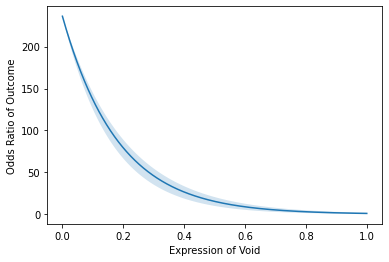

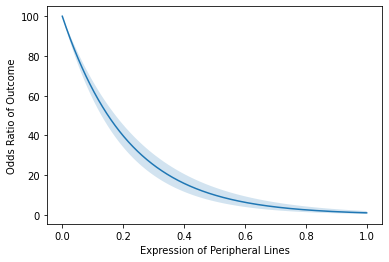

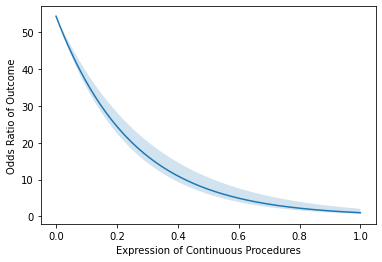

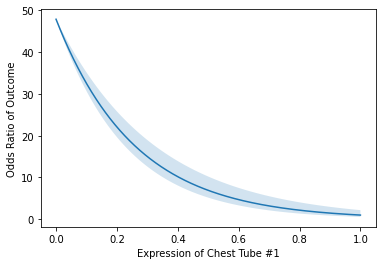

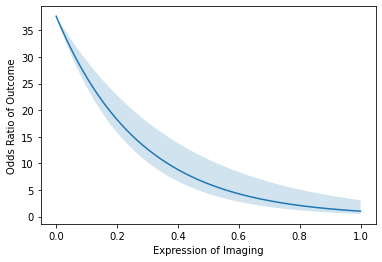

...

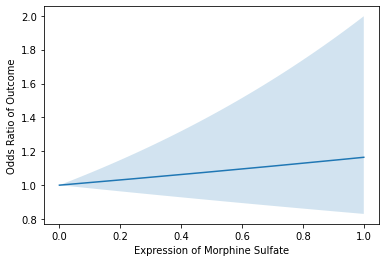

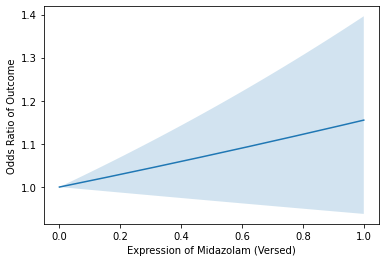

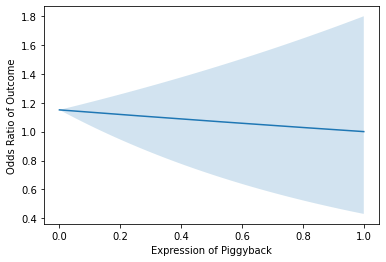

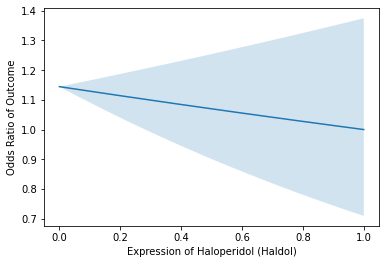

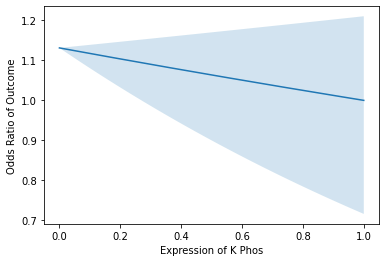

In [12]:
from scContextualized.plot_utils import plot_homogeneous_tx, plot_heterogeneous
plot_homogeneous_tx(cgam.predict_params, C_train, X_train.values, X_train.columns)

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

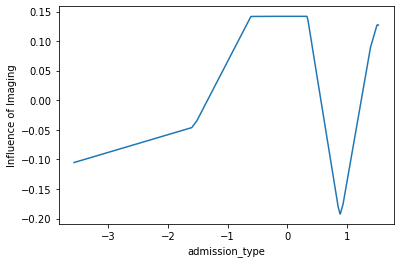

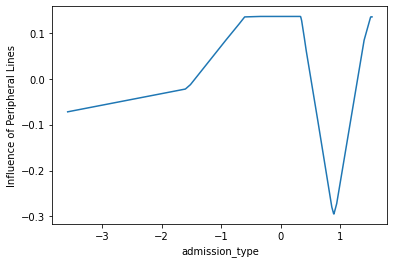

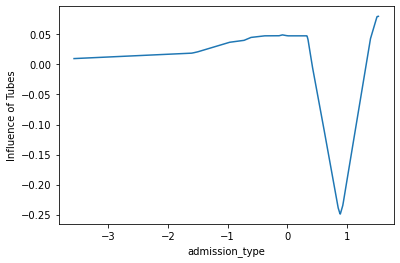

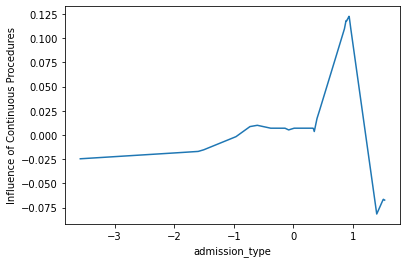

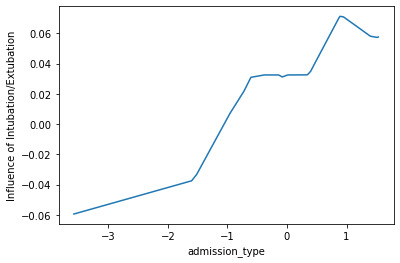

...

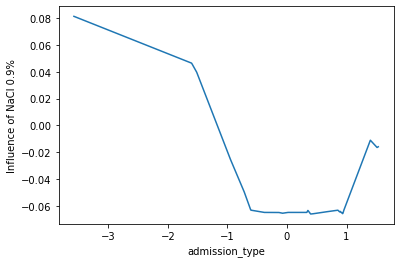

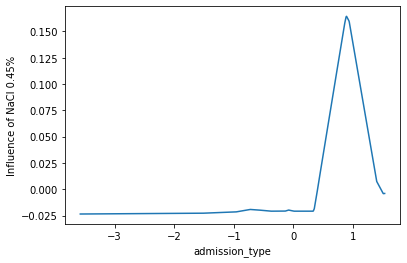

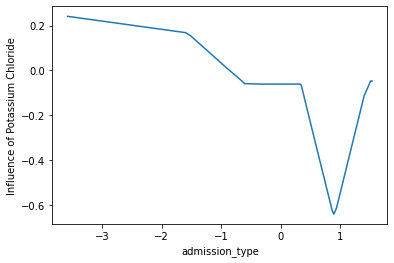

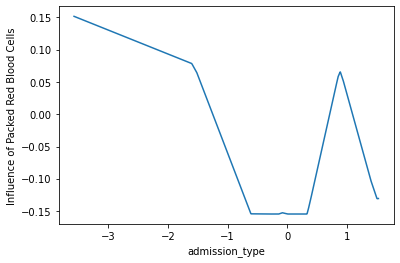

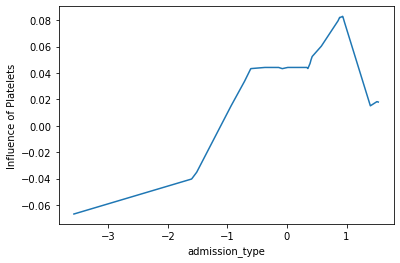

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

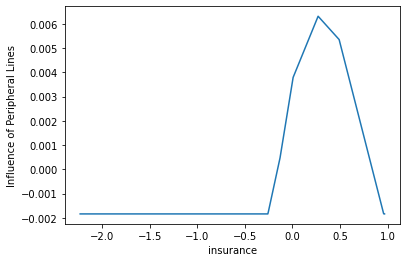

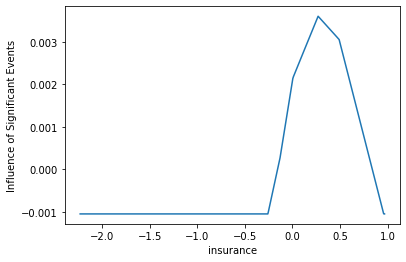

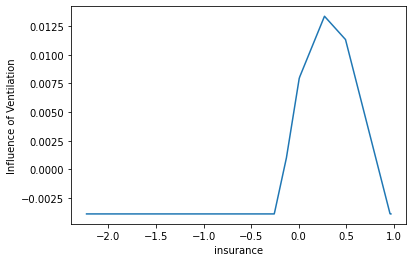

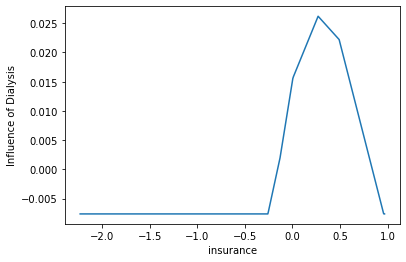

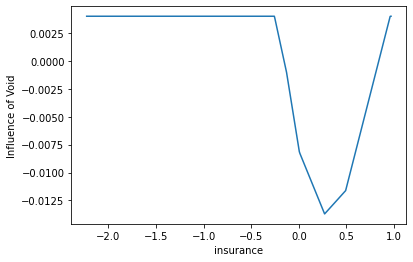

...

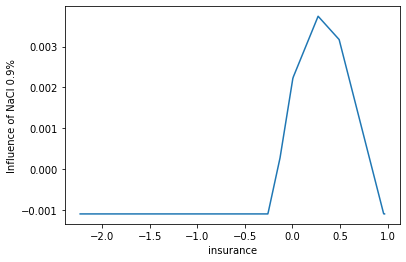

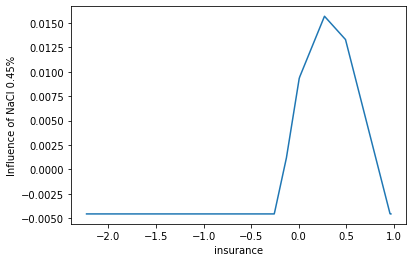

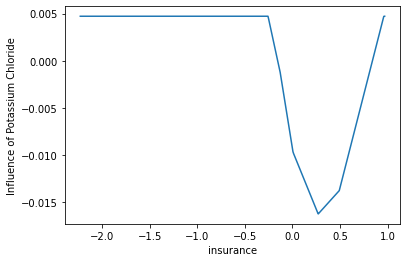

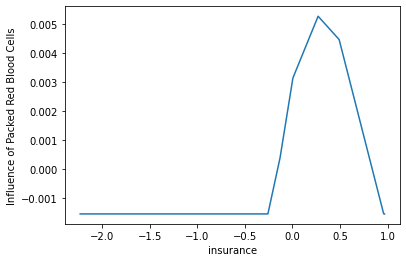

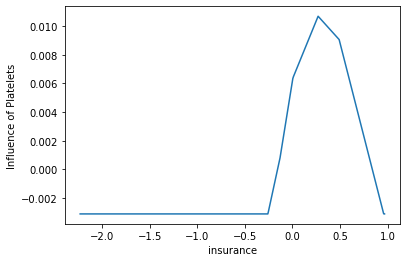

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

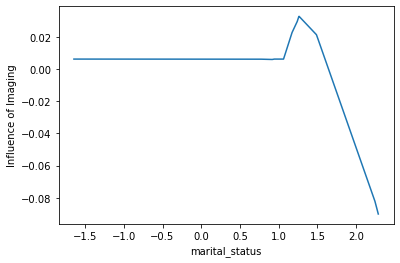

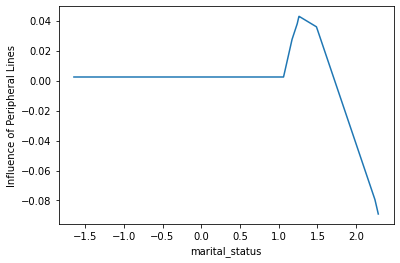

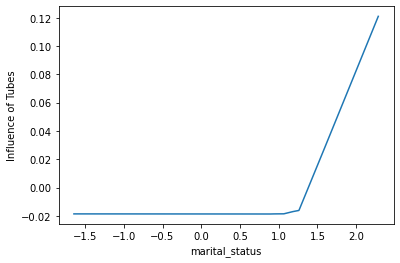

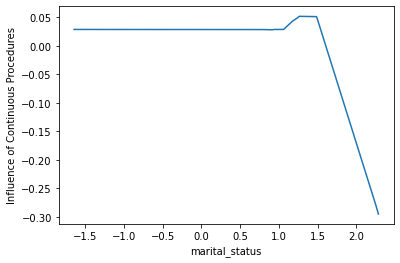

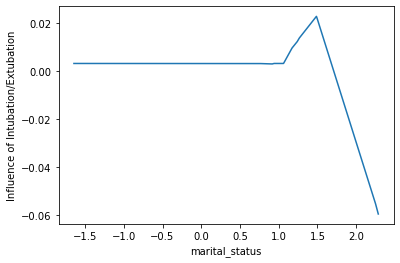

...

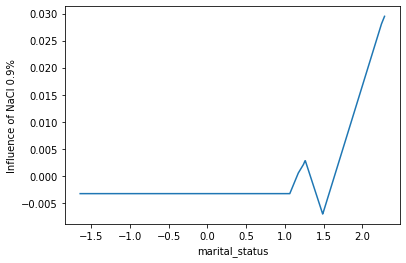

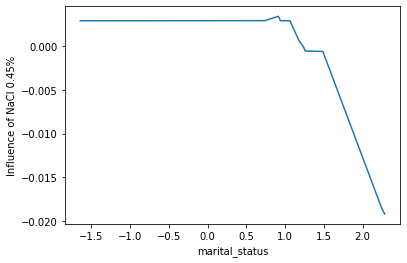

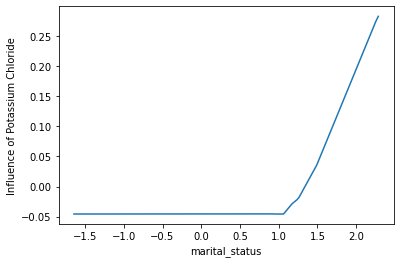

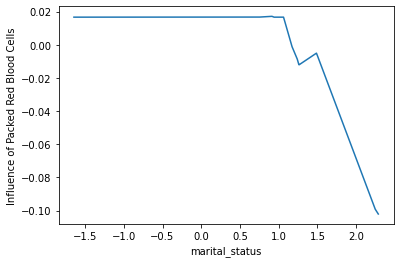

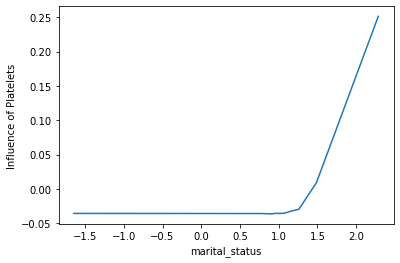

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

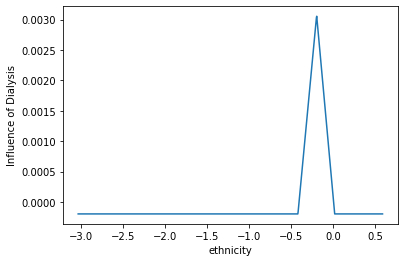

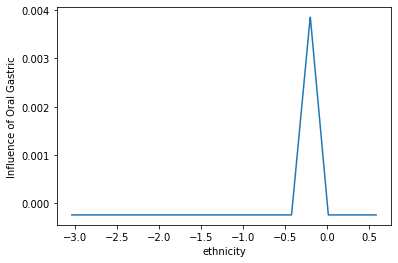

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

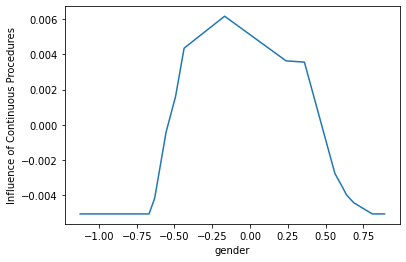

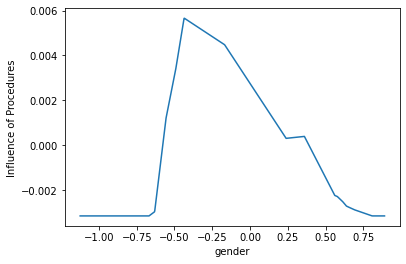

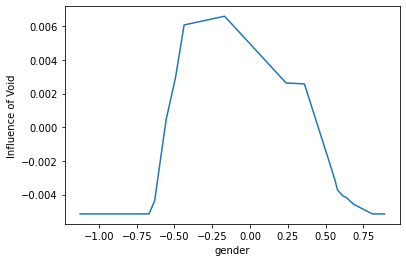

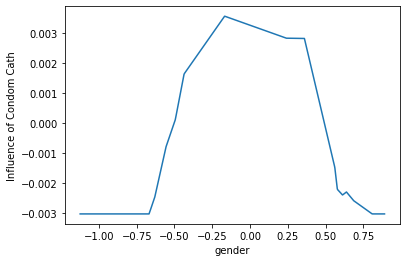

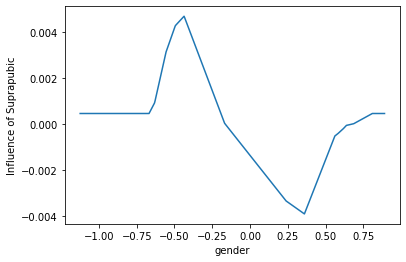

...

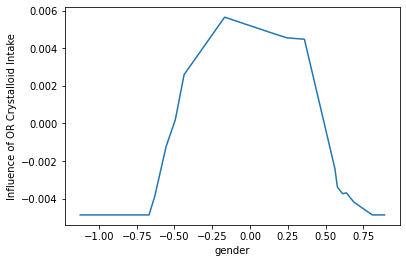

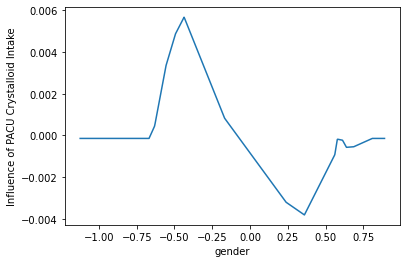

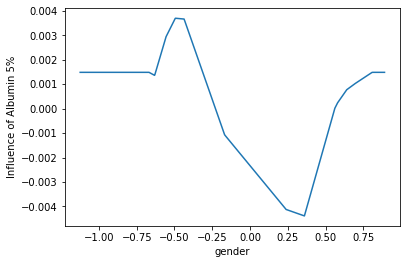

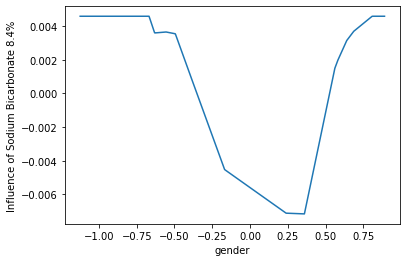

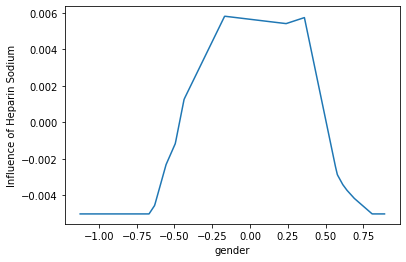

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

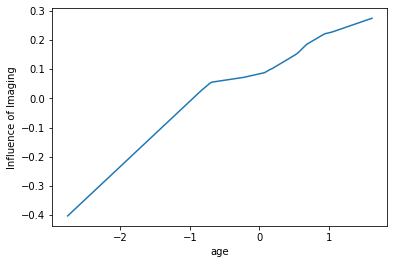

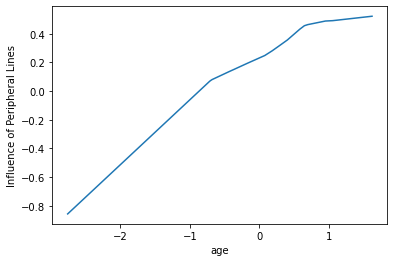

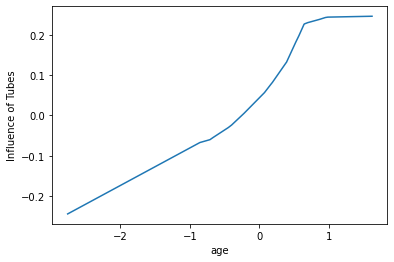

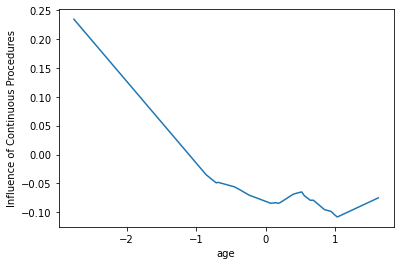

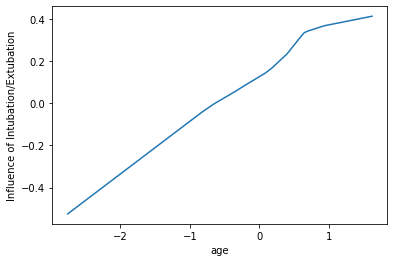

...

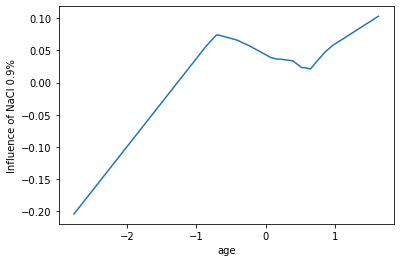

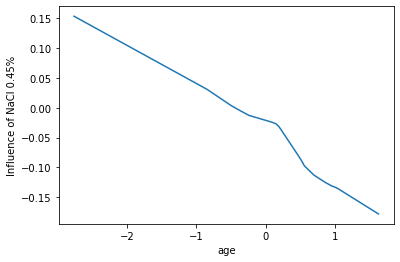

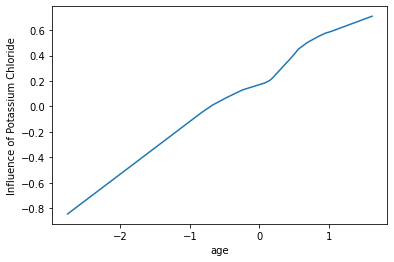

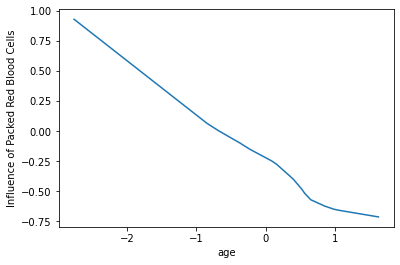

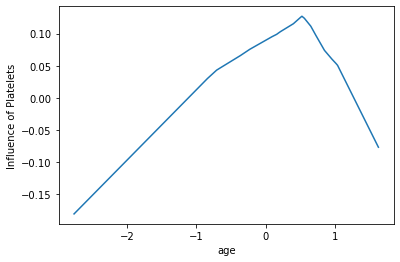

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

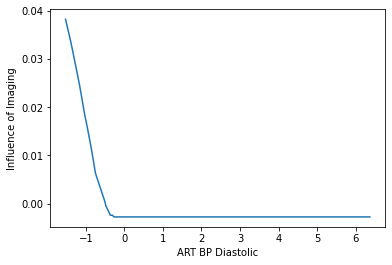

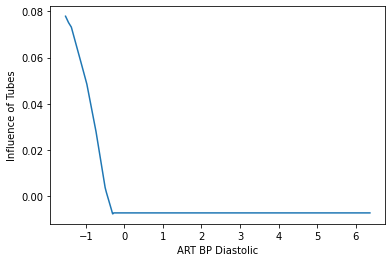

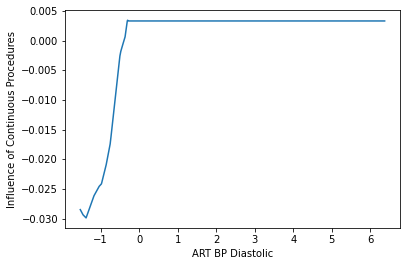

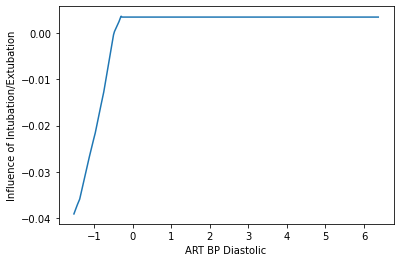

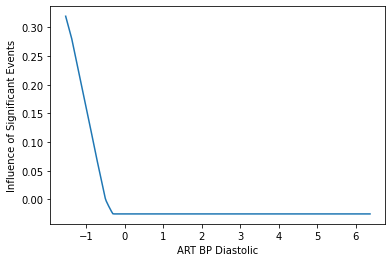

...

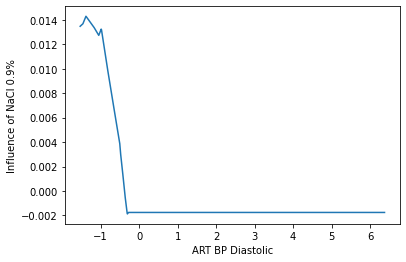

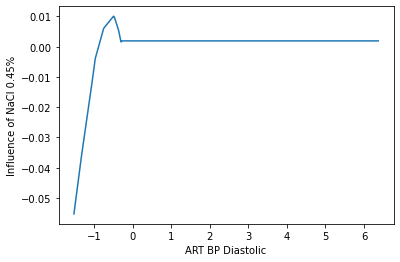

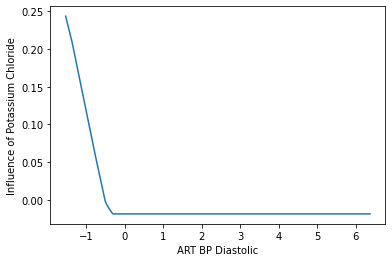

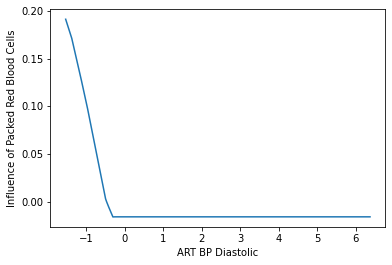

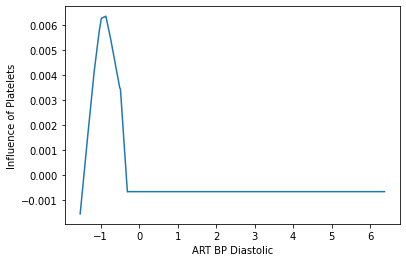

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

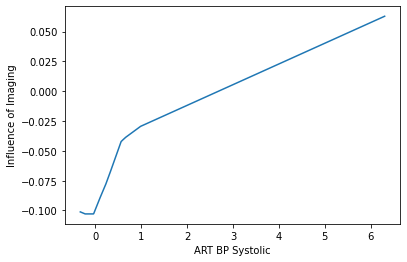

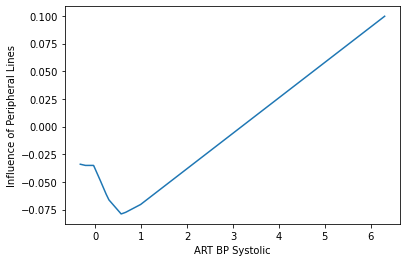

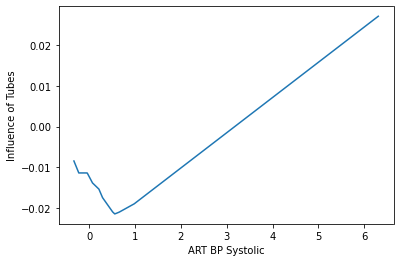

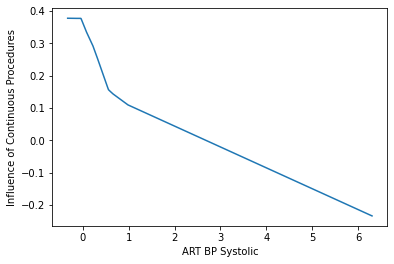

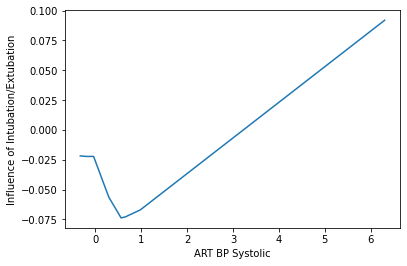

...

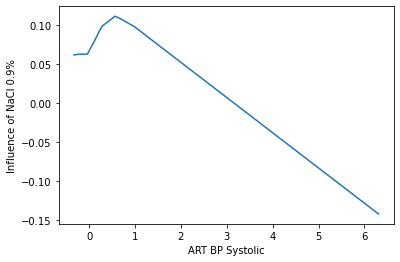

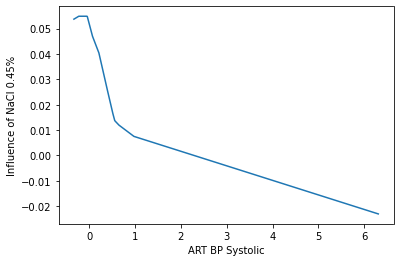

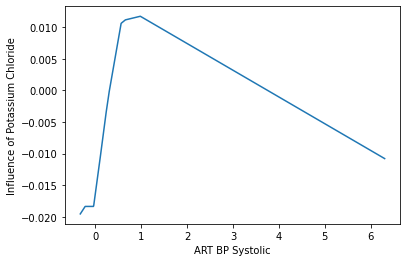

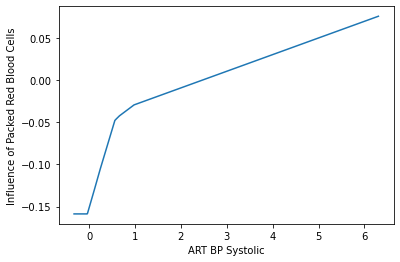

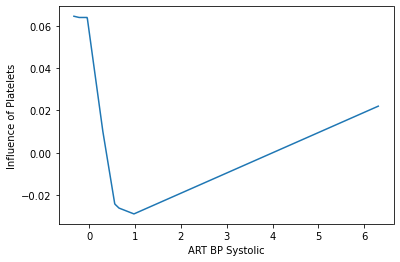

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

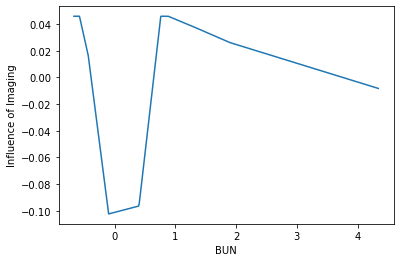

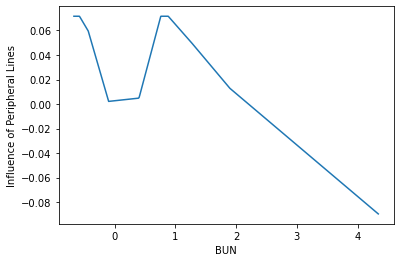

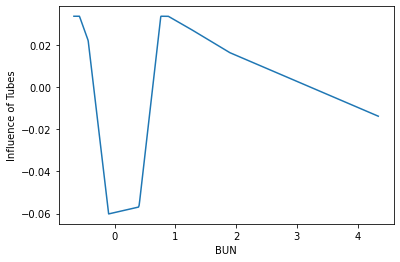

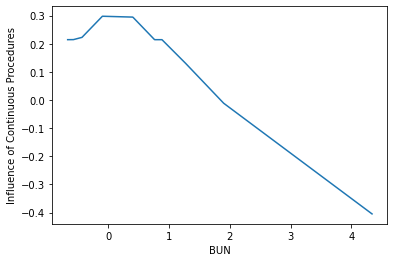

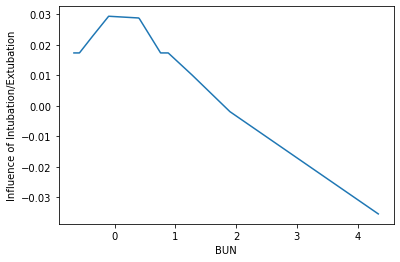

...

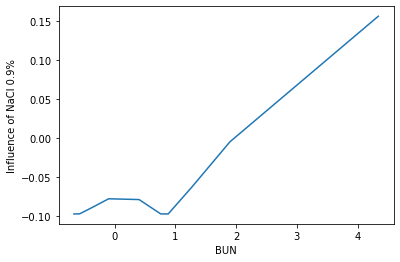

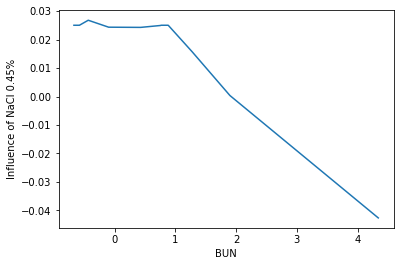

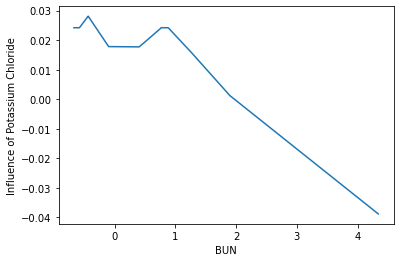

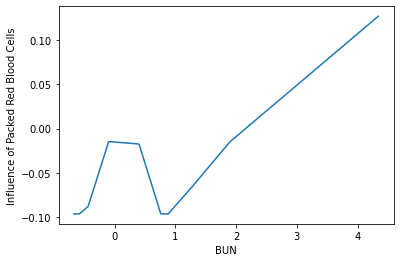

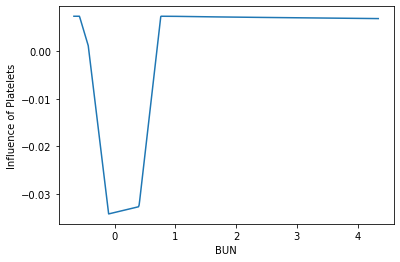

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

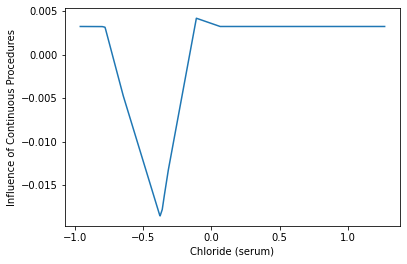

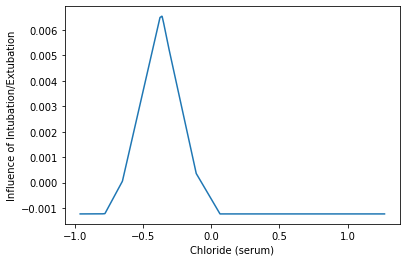

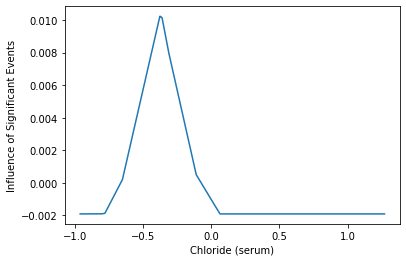

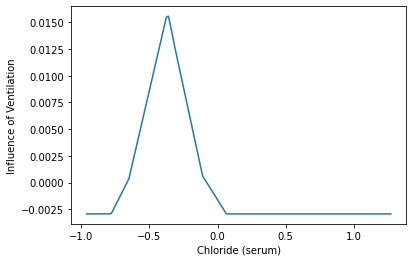

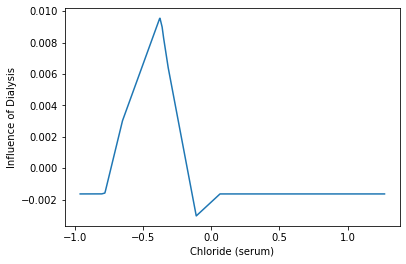

...

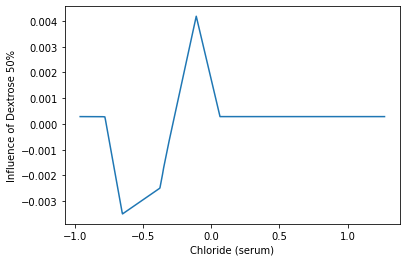

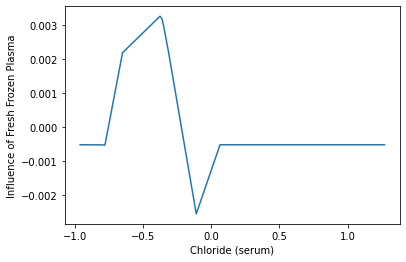

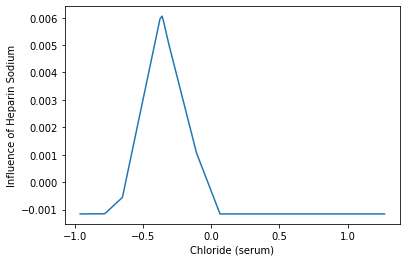

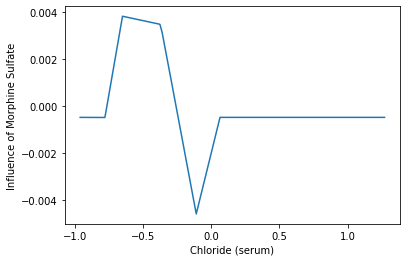

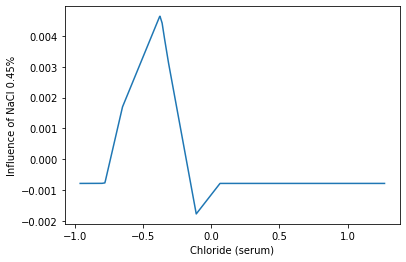

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

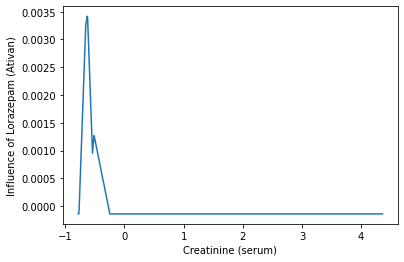

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

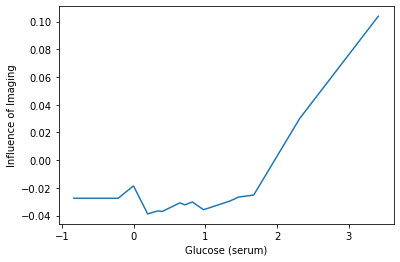

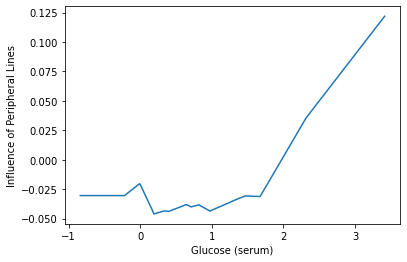

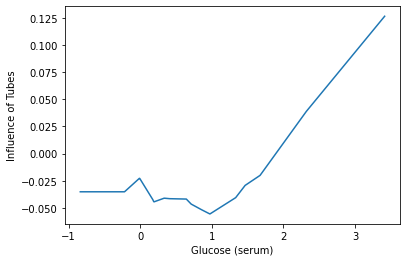

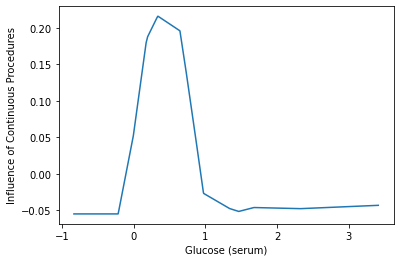

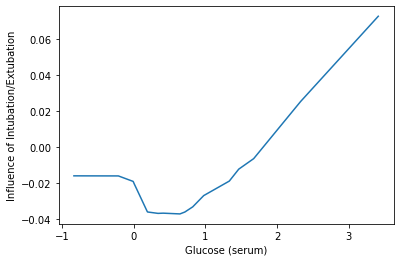

...

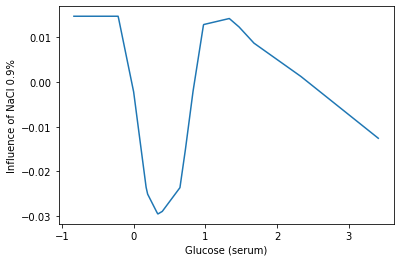

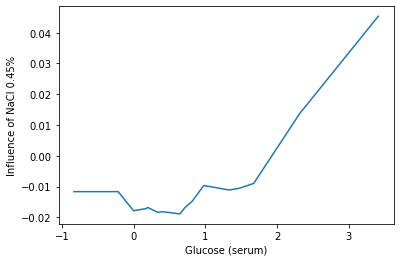

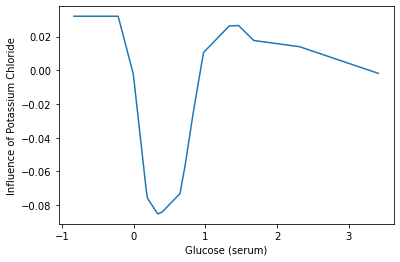

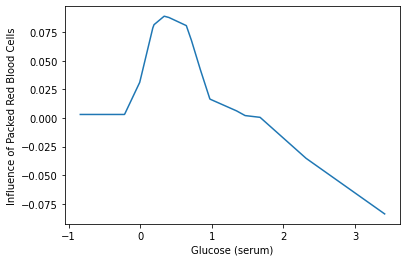

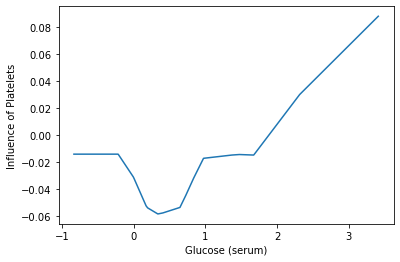

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

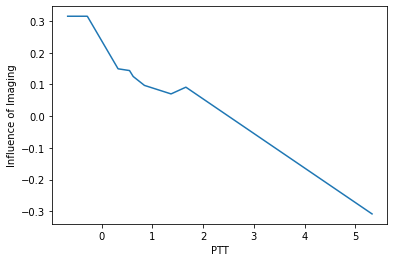

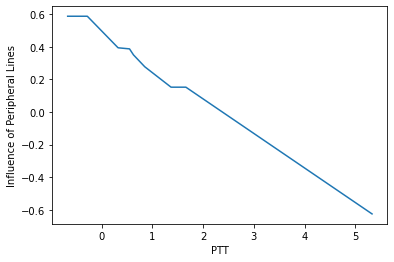

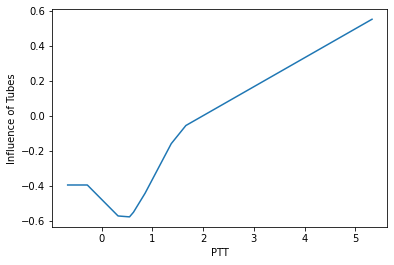

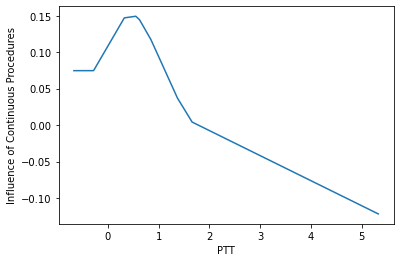

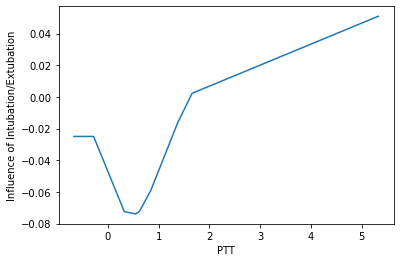

...

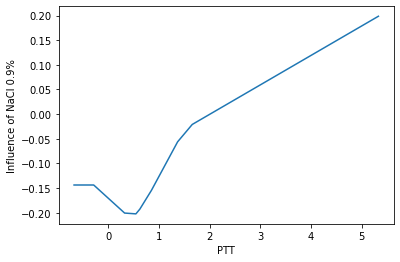

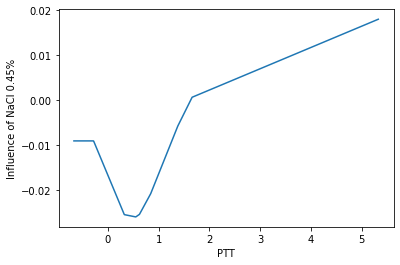

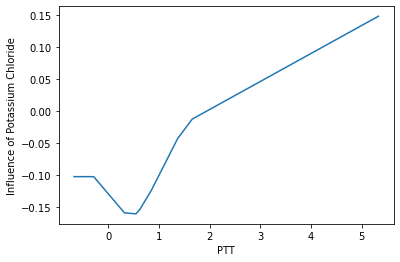

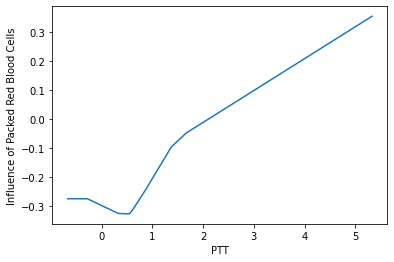

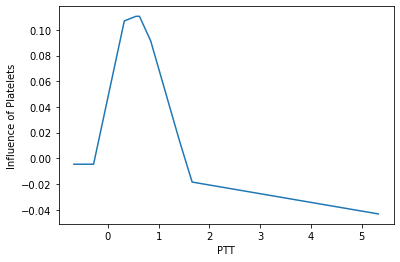

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

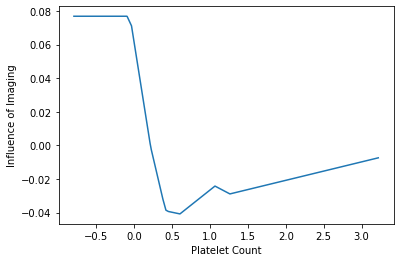

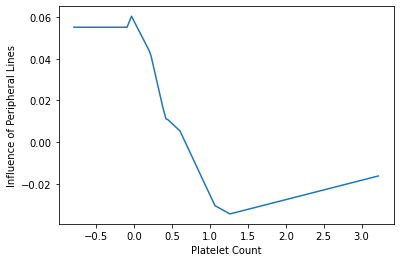

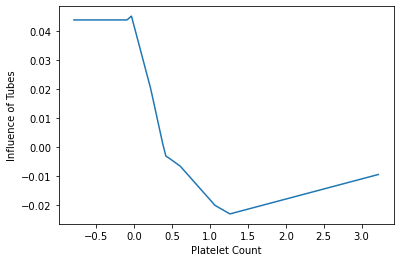

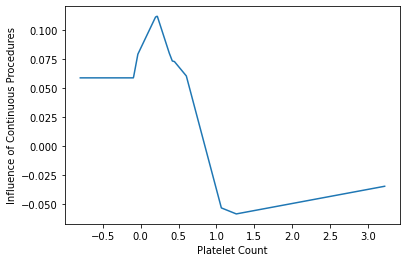

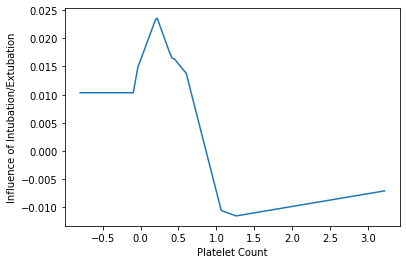

...

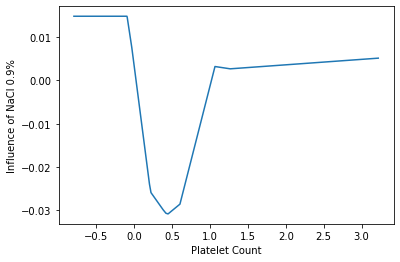

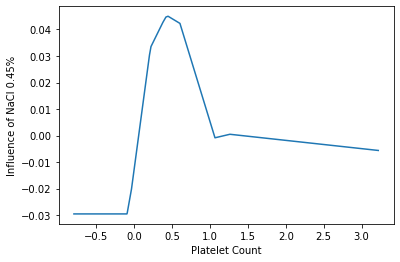

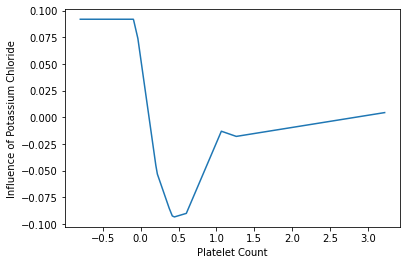

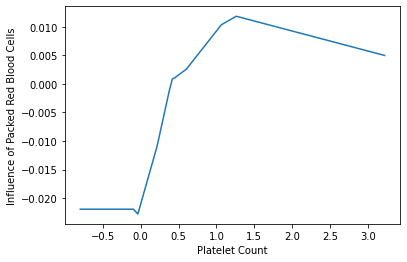

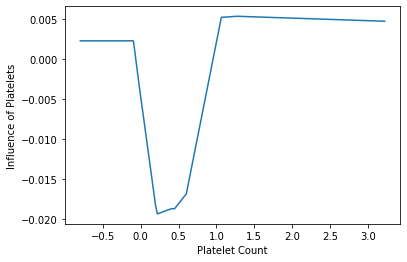

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

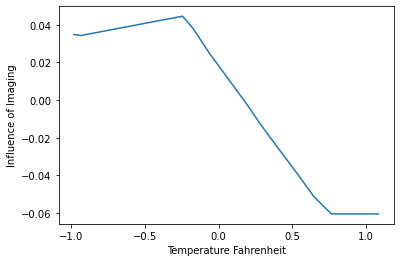

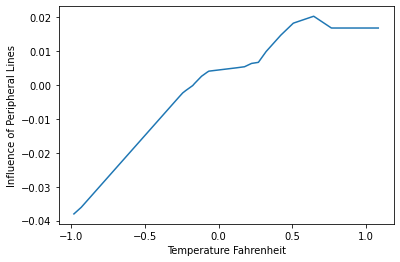

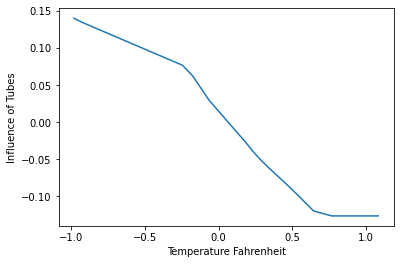

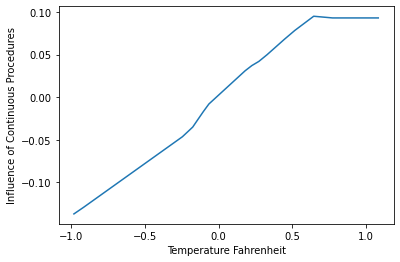

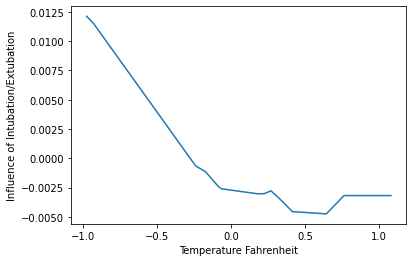

...

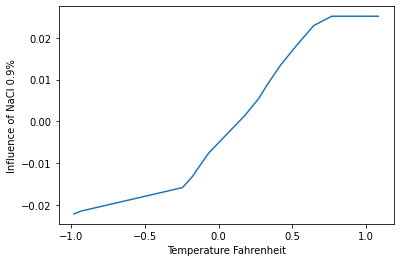

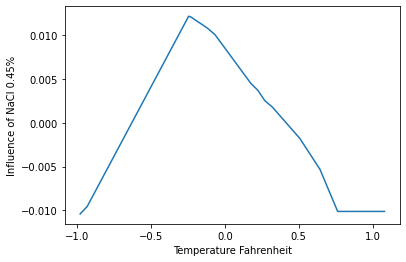

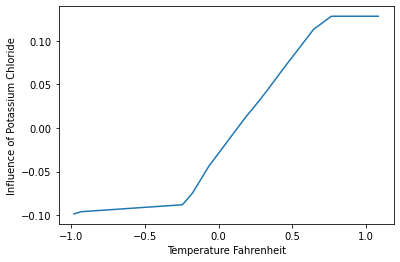

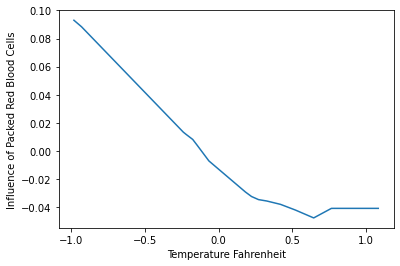

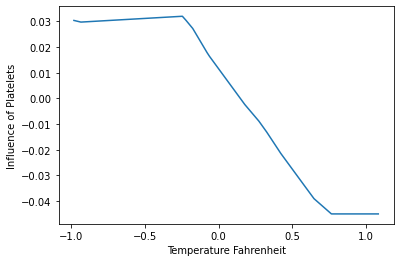

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

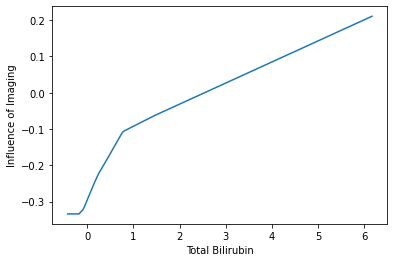

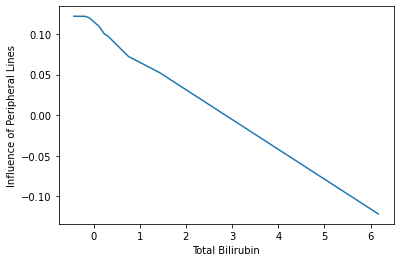

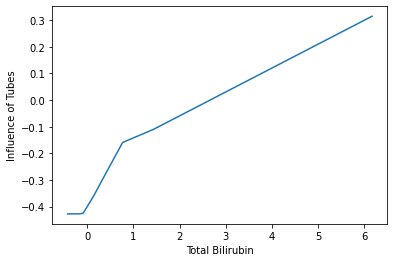

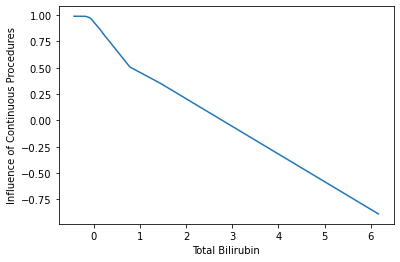

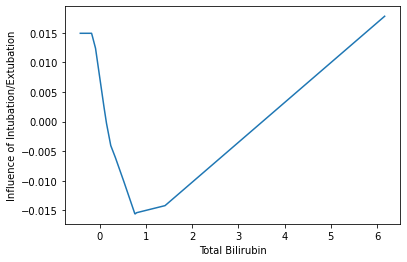

...

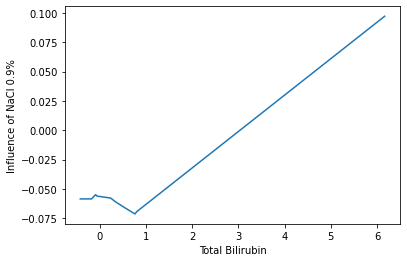

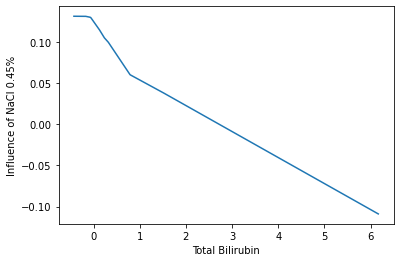

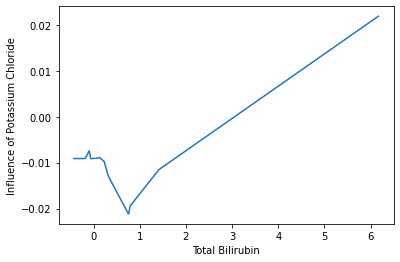

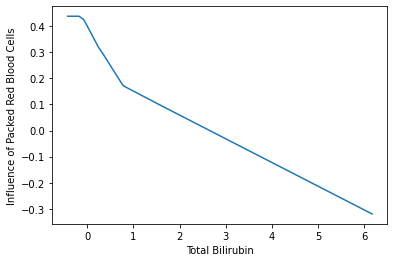

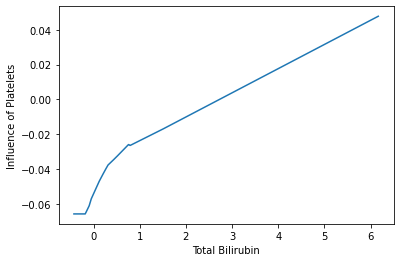

/Users/blengerich/Library/Python/3.7/lib/python/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

Predicting: 45924it [00:00, ?it/s]

In [13]:
# Plot Heterogeneous Factors.
plot_heterogeneous(cgam.predict_params, C_train, X_train.values, 
                   [], C_means, C_stds, X_train.columns)